Learning Dynamics of RBMs in Ising Model
=====================

TODO
-----
1. Change beta and system size, learning rate and the number of training samples.
2. Change the 1D model to mean field model.
3. Check if the model performs significantly worst with the Bernoulli and not spin - the system should learn this.
4. Increase the batch size to decrease noise.
5. Run the data on EXACTLY SYMMETRIC SYSTEMS
6. HOW TO APPEND TO WEIGHT MATRIX instead of reinitializing.

### Observations

1. If the batch size is big - the bump starts to move, check dependence of correlation length on batch size
2. Increase the learning rate peridically may lead the system to converge to a different bump
3. 

In [1]:
import sys
import os
sys.path.append('Jerome_scripts_Original/PGM/')
sys.path.append('selfPackages/')
sys.path.append('Jerome_scripts_Original/')
sys.path.append('ffmpeg-3.4.2-32bit-static/')

import numpy as np
import scipy as sc
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt

try:
    import rbm
    import bm
except:
    print 'Compiling cy_utilities first'
    curr_dir = os.getcwd()
    os.chdir('PGM/')
    !python setup.py build_ext --inplace
    print 'Compilation done'
    os.chdir(curr_dir)
    
import pickle
from ising import IsingModel
import estimate_correlations_ising
from sklearn.utils import shuffle
import inlineMovies

In [17]:
#import dill
#dill.dump_session('./data_bruckner/data/notebookData/1_isingModelRBMs.db')

In [2]:
import dill
dill.load_session('./data_bruckner/data/notebookData/1_isingModelRBMs.db')

(10000, 100)


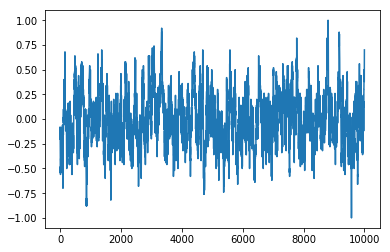

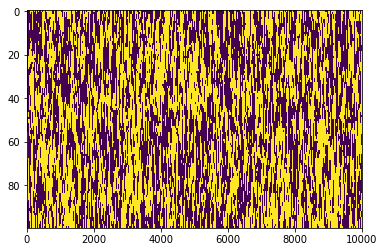

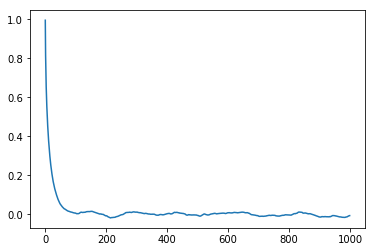

In [11]:
#Defining parameters

N = 100
beta = 1.
Num_configs = 10000

#Generate spins using Gibbs Sampling MCMC
BM = bm.BM(N=N,nature='Spin')

#Define Couplings
BM.layer.couplings =  beta* (np.eye(N=N,k=1) + np.eye(N=N,k=-1) )
BM.layer.couplings[0,-1] += beta
BM.layer.couplings[-1,0] += beta

data = BM.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=1) # N steps.
print data.shape
plt.plot(data.mean(1));plt.show()
plt.imshow(data.T,aspect='auto');plt.show()

#Estimate Correlation to determine the number of steps for independent samples.
import estimate_correlations_ising
Xcorr = estimate_correlations_ising.spin_autocorr(data,n_max=int(Num_configs*0.1))
plt.plot(Xcorr);plt.show()

(10000, 100)


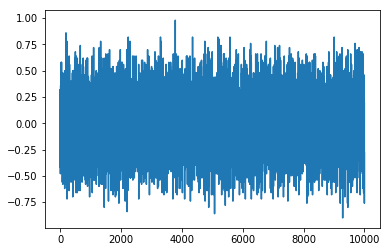

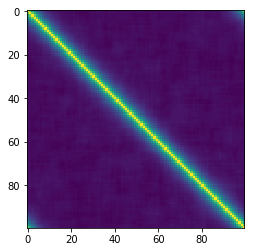

In [12]:
data = BM.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=200) # N steps.
print data.shape
plt.plot(data.mean(-1))

#Finding the correlation and visualizing it
C = np.corrcoef(data.T)
plt.figure(figsize=(8,4))
plt.imshow(C)

In [5]:
%%capture capt1
#Supress the output of the cell and save it to capt1

#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 1, hidden = 'Spin',zero_field = True)
results = RBM.fit(data,n_iter=500,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False);

In [3]:
inlineMovies.generatePlot(Ydata=np.array(results['W']),Xdata=None,xlim=None,ylim=None,frames=None,interval=20)

ValueError: I/O operation on closed file

## Increasing the Batch Size

In [37]:
%%capture capt2
#Supress the output of the cell and save it to capt1

#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 1, hidden = 'Spin',zero_field = True)
results = RBM.fit(data,n_iter=500,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=100,N_MC= 20, lr_decay=False,batch_norm=False);

In [38]:
inlineMovies.generatePlot(Ydata=np.array(results['W']),Xdata=None,xlim=None,ylim=None,frames=None,interval=20)

## Increasing the learning rate - does the bump move

In [6]:
%%capture capt2
#Supress the output of the cell and save it to capt1
N = 100
beta = 1.
Num_configs = 10000
#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 1, hidden = 'Spin',zero_field = True)
results = RBM.fit(data,n_iter=500,verbose=0,learning_rate = 0.01,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False);

In [4]:
inlineMovies.generatePlot(Ydata=np.array(results['W']),Xdata=None,xlim=None,ylim=None,frames=None,interval=20)

ValueError: I/O operation on closed file

## With two hidden units

In [71]:
%%capture capt1
#Supress the output of the cell and save it to capt1

#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 2, hidden = 'Spin',zero_field = True)
results = RBM.fit(data,n_iter=250,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False);

In [94]:
from ffmpeg import ffmpeg 
#from ffmpy import FFmpeg
inlineMovies.generatePlot(Ydata=np.array(results['W']),Xdata=None,xlim=None,ylim=None,frames=None,interval=20)

ImportError: No module named ffmpeg

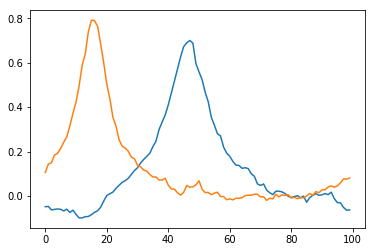

In [72]:
plt.plot(np.roll(np.array(results['W'])[-1,0],-20))
plt.plot(np.roll(np.array(results['W'])[-1,1],-20))

In [15]:
%%capture capt2
#Supress the output of the cell and save it to capt1

#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 2, hidden = 'Spin',zero_field = True)
RBM.weights = np.array(results['W'])[-1]
results2 = RBM.fit(data,n_iter=250,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False,init='previous');

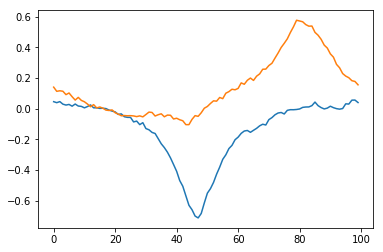

In [16]:
plt.plot(np.roll(np.array(results2['W'])[-1,0],-20))
plt.plot(np.roll(np.array(results2['W'])[-1,1],-20))

## With Three hidden units

In [189]:
%%capture capt1
#Supress the output of the cell and save it to capt1

N = 100
beta = 1.
Num_configs = 10000

#Generate spins using Gibbs Sampling MCMC
BM = bm.BM(N=N,nature='Spin')

#Define Couplings
BM.layer.couplings =  beta* (np.eye(N=N,k=1) + np.eye(N=N,k=-1) )
BM.layer.couplings[0,-1] += beta
BM.layer.couplings[-1,0] += beta

data = BM.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=200) # N steps.

#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 3, hidden = 'Spin',zero_field = True)
results = RBM.fit(data,n_iter=250,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False);

In [193]:
reload(inlineMovies)
#print np.array(results['W']).shape
inlineMovies.generatePlot(Ydata=np.array(results['W']),Xdata=None,xlim=None,ylim=None,frames=2500,interval=20)

## Change beta to check the width of the bump

#### Note: Changing beta also implies chnaging the time to thermalize and changing the system size for finite size effects and changing the correlation lengths and the numebr of samples to wait for for thermalization

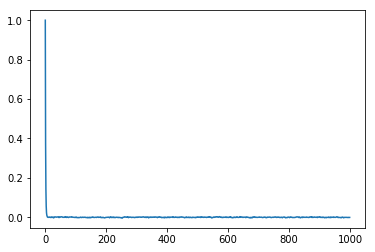

In [174]:
N = 100
beta = 0.1
Num_configs = 10000

#Generate spins using Gibbs Sampling MCMC
BM = bm.BM(N=N,nature='Spin')

#Define Couplings
BM.layer.couplings =  beta* (np.eye(N=N,k=1) + np.eye(N=N,k=-1) )
BM.layer.couplings[0,-1] += beta
BM.layer.couplings[-1,0] += beta

data = BM.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=1) # N steps.
#plt.plot(data.mean(1));plt.show()
#plt.imshow(data.T,aspect='auto');plt.show()

#Estimate Correlation to determine the number of steps for independent samples.
import estimate_correlations_ising
Xcorr = estimate_correlations_ising.spin_autocorr(data,n_max=int(Num_configs*0.1))
plt.plot(Xcorr);plt.show()

In [197]:
%%capture capt899
#Supress the output of the cell and save it to capt

data = BM.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=50) # N steps.
plt.plot(data.mean(-1))

#Finding the correlation and visualizing it
#C = np.corrcoef(data.T)
#plt.figure(figsize=(8,4))
#plt.imshow(C)

#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 1, hidden = 'Spin',zero_field = True)
#RBM.weights = np.ones(N)
results = RBM.fit(data,n_iter=250,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False);

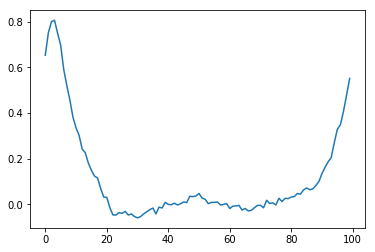

In [194]:
plt.plot(RBM.weights[0])

In [198]:
inlineMovies.generatePlot(Ydata=np.array(results['W']),Xdata=None,xlim=None,ylim=None,frames=None,interval=20)

#### The correlation length has decreased about 10 times, which means the network is trying to learn more information? What happendin PERFECTLY SYMMETRIC CASE?

## Increase Beta so that the correlation length increase 10 times

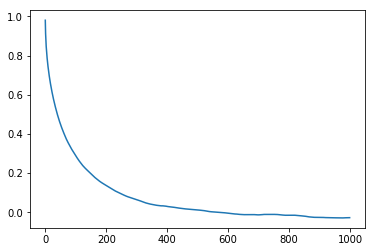

In [181]:
N = 500
beta = 1.5
Num_configs = 10000

#Generate spins using Gibbs Sampling MCMC
BM = bm.BM(N=N,nature='Spin')

#Define Couplings
BM.layer.couplings =  beta* (np.eye(N=N,k=1) + np.eye(N=N,k=-1) )
BM.layer.couplings[0,-1] += beta
BM.layer.couplings[-1,0] += beta

data = BM.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=1) # N steps.
#plt.plot(data.mean(1));plt.show()
#plt.imshow(data.T,aspect='auto');plt.show()

#Estimate Correlation to determine the number of steps for independent samples.
import estimate_correlations_ising
Xcorr = estimate_correlations_ising.spin_autocorr(data,n_max=int(Num_configs*0.1))
plt.plot(Xcorr);plt.show()

In [182]:
%%capture capt8798
#Supress the output of the cell and save it to capt

data = BM.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=800) # N steps.
plt.plot(data.mean(-1))

#Finding the correlation and visualizing it
#C = np.corrcoef(data.T)
#plt.figure(figsize=(8,4))
#plt.imshow(C)

#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 1, hidden = 'Spin',zero_field = True)
results = RBM.fit(data,n_iter=250,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False);

In [185]:
inlineMovies.generatePlot(Ydata=np.array(results['W']),Xdata=None,xlim=None,ylim=None,frames=None,interval=10)

## Training the model on exactly symmetric training set 

In [23]:
#%%capture capt1
#Supress the output of the cell and save it to capt1

N = 100
beta = 1.
Num_configs = 10000

#Generate spins using Gibbs Sampling MCMC
BM = bm.BM(N=N,nature='Spin')

#Define Couplings
BM.layer.couplings =  beta* (np.eye(N=N,k=1) + np.eye(N=N,k=-1) )
BM.layer.couplings[0,-1] += beta
BM.layer.couplings[-1,0] += beta

data = np.zeros([Num_configs,N])
data_master = BM.gen_data(Nchains=1,Nthermalize=500,Lchains=2,Nstep=500) # N steps.
roll_index = np.random.randint(0,N,Num_configs)

#Generate data by randomly rolling the array. There may be repetitions of the data since num of samples are much larger than the number of spins
for i in range(Num_configs):
    data[i] = np.roll(data_master[1],roll_index[i])

#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 1, hidden = 'Spin',zero_field = True)
results = RBM.fit(data,n_iter=250,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False);

Starting epoch 1
Starting epoch 2
Starting epoch 3
Starting epoch 4
Starting epoch 5
Starting epoch 6
Starting epoch 7
Starting epoch 8
Starting epoch 9
Starting epoch 10
Starting epoch 11
Starting epoch 12
Starting epoch 13
Starting epoch 14
Starting epoch 15
Starting epoch 16
Starting epoch 17
Starting epoch 18
Starting epoch 19
Starting epoch 20
Starting epoch 21
Starting epoch 22
Starting epoch 23
Starting epoch 24
Starting epoch 25
Starting epoch 26
Starting epoch 27
Starting epoch 28
Starting epoch 29
Starting epoch 30
Starting epoch 31
Starting epoch 32
Starting epoch 33
Starting epoch 34
Starting epoch 35
Starting epoch 36
Starting epoch 37
Starting epoch 38
Starting epoch 39
Starting epoch 40
Starting epoch 41
Starting epoch 42
Starting epoch 43
Starting epoch 44
Starting epoch 45
Starting epoch 46
Starting epoch 47
Starting epoch 48
Starting epoch 49
Starting epoch 50
Starting epoch 51
Starting epoch 52
Starting epoch 53
Starting epoch 54
Starting epoch 55
Starting epoch 56
S

In [25]:
inlineMovies.generatePlot(Ydata=np.array(results['W']),Xdata=None,xlim=None,ylim=None,frames=None,interval=20)

Using a Mean Field Model with fully connected neighbours
---------------------------------------

The correlation matrix is fully connected.

In [ ]:
N = 100
Num_configs = 1000
beta = 1.

BM.layer.couplings = beta/N * (np.ones([N,N]))

data = BM.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=1) # N steps.
print data.shape
plt.plot(data.mean(1));plt.show()
plt.imshow(data.T,aspect='auto');plt.show()

#Estimate Correlation to determine the number of steps for independent samples.
import estimate_correlations_ising
Xcorr = estimate_correlations_ising.spin_autocorr(data,n_max=int(Num_configs*0.1))
plt.plot(Xcorr);plt.show()

data = BM.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=200) # N steps.
print data.shape
plt.plot(data.mean(-1))

#Finding the correlation and visualizing it
C = np.corrcoef(data.T)
plt.figure(figsize=(8,4))
plt.imshow(C)


In [ ]:
%%capture capt2
#Supress the output of the cell and save it to capt1

#Train the model
RBM = rbm.RBM(visible = 'Spin', n_v=N, n_h = 1, hidden = 'Spin',zero_field = True)
results = RBM.fit(data,n_iter=100,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False);

In [ ]:
inlineMovies.generatePlot(Ydata=np.array(results['W'])[:,0,:],Xdata=None,xlim=None,ylim=None,frames=100,interval=20)

In [12]:
print data.shape

(10000, 100)


# Small Beta test:

In [60]:
N = 100
beta2 = 0.1
Num_configs = 10000

#Generate spins using Gibbs Sampling MCMC
BM2 = bm.BM(N=N,nature='Spin')

#Define Couplings
BM2.layer.couplings =  beta2* (np.eye(N=N,k=1) + np.eye(N=N,k=-1) )
BM2.layer.couplings[0,-1] += beta2
BM2.layer.couplings[-1,0] += beta2

data2 = BM2.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=200) # N steps.

In [68]:
%%capture capt21
#Supress the output of the cell and save it to capt1
from scipy.stats import norm
#Train the model
RBM21 = rbm.RBM(visible = 'Spin', n_v=N, n_h = 1, hidden = 'Spin',zero_field = True)
RBM21.weights = 0.01*np.random.normal(loc=0,scale=0.1,size=(1,N))
RBM21.weights += 25*norm.pdf(x=np.linspace(0,99,100),loc=40,scale=5)
results21 = RBM21.fit(data2,n_iter=250,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False,init='previous');

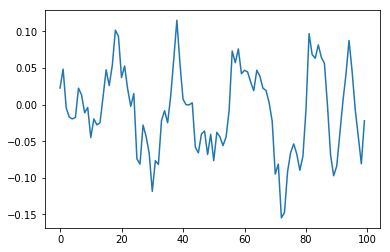

In [7]:
#plt.plot(np.roll(np.array(results21['W'])[-100,0],-30))
plt.plot(np.roll(np.array(results21['W'])[-1,0],0))

In [63]:
%%capture capt22
#Supress the output of the cell and save it to capt1

#Train the model
RBM22 = rbm.RBM(visible = 'Spin', n_v=N, n_h = 2, hidden = 'Spin',zero_field = True)
results22 = RBM22.fit(data2,n_iter=250,verbose=0,learning_rate = 0.001,record=['W'],record_interval=100,batch_size=10,N_MC= 20, lr_decay=False,batch_norm=False);

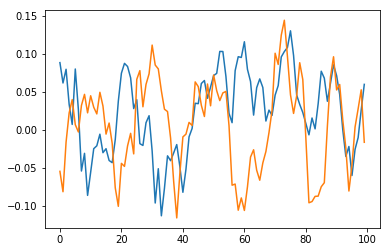

In [64]:
plt.plot(np.roll(np.array(results22['W'])[-1,0],-0))
plt.plot(np.roll(np.array(results22['W'])[-1,1],-0))

## Is this fitting noise - Compare likelihood values for the data it has been trained on and new data?

In [8]:
data2_test = BM2.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=200) # N steps.

In [15]:
data2_test2 = BM2.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=200) # N steps.
data2_test3 = BM2.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=200) # N steps.
data2_test4 = BM2.gen_data(Nchains=1,Nthermalize=0,Lchains=Num_configs,Nstep=200) # N steps.

In [16]:
print RBM21.likelihood(data2).mean()
print RBM21.likelihood(data2_test).mean()
print RBM21.likelihood(data2_test2).mean()
print RBM21.likelihood(data2_test3).mean()
print RBM21.likelihood(data2_test4).mean()
print RBM21.likelihood(data).mean()

-69.2901629852
-69.310549073
-69.3155283028
-69.3106968819
-69.313794768
-69.1143260592
